In [172]:
# Import all the libraries

import pandas as pd
import datetime
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import pyplot as plt
from IPython.display import display, HTML


# Load data to data frame
data = pd.read_json('./city_search.json')

#Using time stamp get the hour, day, month, and  of the search session
data['unix_timestamp'] = data['unix_timestamp'].apply(lambda x: datetime.datetime.fromtimestamp(x[0]))
data['session_year'] = [datetime.datetime.date(d).year for d in data['unix_timestamp']]
data['session_month'] = [datetime.datetime.date(d).month for d in data['unix_timestamp']]
data['session_day'] = [datetime.datetime.date(d).day for d in data['unix_timestamp']]
data['session_hour'] = [datetime.datetime.time(d).hour for d in data['unix_timestamp']]

# Get the session_id, cities, and user properties like the country, joining data and user id
data['session_id'] = data['session_id'].apply(lambda x: x[0])
data['cities'] = data['cities'].apply(lambda x: x[0])
data['user_id'] = data['user'].apply(lambda x: x[0][0]['user_id'])
data['joining_date'] = data['user'].apply(lambda x: x[0][0]['joining_date'])
data['country'] = data['user'].apply(lambda x: x[0][0]['country'])

# Drop the users column 
data.drop('user', axis=1, inplace=True)

#Print data
data.head(10)



,session_id,unix_timestamp,cities,session_year,session_month,session_day,session_hour,user_id,joining_date,country
0,X061RFWB06K9V,2015-09-17 11:28:28,"New York NY, Newark NJ",2015,9,17,11,2024,2015-03-22,UK
1,5AZ2X2A9BHH5U,2015-09-04 04:06:31,"New York NY, Jersey City NJ, Philadelphia PA",2015,9,4,4,2853,2015-03-28,DE
2,SHTB4IYAX4PX6,2015-08-29 06:18:10,San Antonio TX,2015,8,29,6,10958,2015-03-06,UK
3,JBRB8MZGTX3M4,2015-03-25 03:21:03,Edmonton AB,2015,3,25,3,7693,2015-03-12,IT
4,YJCMPURC2FL9C,2015-05-02 05:31:07,"Phoenix AZ, Houston TX",2015,5,2,5,7506,2015-02-28,UK
5,LKOKP80QD6BEO,2015-06-13 08:53:11,San Diego CA,2015,6,13,8,3743,2015-03-04,ES
6,YOVUIM79SGS5Y,2015-09-25 05:04:47,"Montreal QC, Chicago IL",2015,9,25,5,8831,2015-03-02,
7,SHXEY67QWKP9K,2015-05-16 04:48:24,"Calgary AB, New York NY",2015,5,16,4,587,2015-03-16,
8,9P74JL5KMC9G9,2015-06-20 12:04:06,"Chicago IL, New York NY",2015,6,20,12,365,2015-03-22,US
9,UY49RTVRX3GL7,2015-08-09 03:17:47,New York NY,2015,8,9,3,5995,2015-03-21,


In [173]:
# Print the most searched cities

print("Total number of search count of each city:\n", data['cities'].value_counts()[0:20])

'''The cities like New York, Toronto, Los Angeles, Montreal, Chicago, Vancouver, Houston, Phonix are seached most'''

Total number of search count of each city:
 New York NY                    2278
Toronto ON                     1268
Los Angeles CA                 1072
Montreal QC                     917
Chicago IL                      725
Vancouver BC                    507
Houston TX                      500
Phoenix AZ                      371
Philadelphia PA                 370
San Diego CA                    341
San Antonio TX                  327
Dallas TX                       294
OTTAWA ON                       260
Calgary AB                      243
New York NY, Jersey City NJ     226
San Jose CA                     218
Edmonton AB                     212
Detroit MI                      208
Jacksonville FL                 198
Indianapolis IN                 196
Name: cities, dtype: int64


'The cities like New York, Toronto, Los Angeles, Montreal, Chicago, Vancouver, Houston, Phonix are seached most'

In [174]:
# Total number of users using the website

print(" Total number of sessions:", len(data['session_id']))
print(" Total number of unique users:", len(data['user_id'].unique()))
print(" Total number of unique city searches:", len(data['cities'].unique()))
'''So users return to search the cities in different sessions, in this clustering the users based on the cities

that they searched will add some value to analysing their behavior and give better recommendations'''

 Total number of sessions: 20022
 Total number of unique users: 5777
 Total number of unique city searches: 1329


'So users return to search the cities in different sessions, in this clustering the users based on the cities\n\nthat they searched will add some value to analysing their behavior and give better recommendations'

In [175]:
pd.set_option('display.max_rows', 60000)
pd.set_option('display.max_columns', 6000)
pd.set_option('display.width', 60000)

# Group by the user_id to analyse the time of their session_id and cities searched in each session
data_searched = data.groupby(['user_id','session_id','country', 'session_year', 'session_month', 'session_day', 'session_hour'])['cities'].apply(lambda x: ' '.join(x)).reset_index()
data_searched 

# Analysed if users are searching for same cities in different sessions : mixed results but mostly people do not repeat the searche cities
# User 67 who is from Denmark searched for New York multiple times in March and August, two days apart
# The months of sarch is distributed between March and October and in March the total search count is low and is only less than 9% of total
# I checked to see if there are any seasonal bias for the search and did not find any

,user_id,session_id,country,session_year,session_month,session_day,session_hour,cities
0,4,CZM8I78OJ48BP,DE,2015,6,17,6,"Toronto ON, Oshawa ON"
1,4,E0KQRE7WEWXO3,DE,2015,8,29,7,Vancouver BC
2,4,HCZQHOBXNE7Y3,DE,2015,9,16,3,Vancouver BC
3,4,UN8B7ZWICCN45,DE,2015,8,5,10,"San Antonio TX, Toronto ON"
4,5,6X1FQVSDMKFH5,UK,2015,6,17,4,Toronto ON
5,5,BG8RDDBIENMJY,UK,2015,7,5,9,"Los Angeles CA, New York NY"
6,5,BIDJNPJW1JPQG,UK,2015,6,15,6,New York NY
7,5,OTGA6X9ZP52PQ,UK,2015,4,28,6,"Dallas TX, Los Angeles CA"
8,9,9PYJQT2545006,,2015,7,15,6,"San Diego CA, Chicago IL"
9,9,GDD61VDJP9IC0,,2015,6,17,8,New York NY


In [206]:
# Evaluating the results of total search for each city in August

month_value = 6 # 3, 4, 5, 6, 7, 8, 9, 10
data_evaluation_of_months = data_searched[data_searched['session_month'] ==month_value]
print("Total number of search count of each city:\n", data_evaluation_of_months['cities'].value_counts()[0:20])


Total number of search count of each city:
 New York NY                    328
Toronto ON                     187
Los Angeles CA                 168
Montreal QC                    146
Chicago IL                      98
Houston TX                      90
Vancouver BC                    62
Philadelphia PA                 56
San Diego CA                    49
Phoenix AZ                      46
Dallas TX                       43
Calgary AB                      37
San Antonio TX                  37
Indianapolis IN                 34
Toronto ON, Oshawa ON           33
San Jose CA                     33
New York NY, Jersey City NJ     33
Toronto ON, New York NY         30
Detroit MI                      29
Jacksonville FL                 28
Name: cities, dtype: int64


In [182]:
pd.set_option('display.max_rows', 60000)
pd.set_option('display.max_columns', 6000)
pd.set_option('display.width', 60000)

# Group by the user_id to cluster users based on their search pattern
data_user_searched = data.groupby(['user_id'])['cities'].apply(lambda x: ' '.join(x)).reset_index()
data_user_searched

,user_id,cities
0,4,"Vancouver BC Toronto ON, Oshawa ON Vancouver B..."
1,5,"New York NY Toronto ON Dallas TX, Los Angeles ..."
2,9,"Toronto ON Columbus OH San Diego CA, Chicago I..."
3,10,San Antonio TX Phoenix AZ
4,11,Calgary AB Toronto ON San Diego CA Vancouver B...
5,13,"Los Angeles CA, Montreal QC New York NY, Jerse..."
6,15,"Columbus OH, Toronto ON Toronto ON, Montreal Q..."
7,17,"Chicago IL Phoenix AZ Toronto ON, Saint Cathar..."
8,18,"Chicago IL, Fort Wayne IN, Cincinnati OH, Lexi..."
9,20,"New York NY, Toronto ON Los Angeles CA, New Yo..."


In [183]:
# data with users as row and the unique city search as the columns
cust_cities = pd.crosstab(data.user_id, data.cities)
print("Shape of the dataframe:", cust_cities.shape)



Shape of the dataframe: (5777, 1329)


In [184]:
# There are 5777features, to do clustering, I need to reduce the dimentionality

# I am using PCA for this, which will reduce my features to 6, the numbr of principal components I have chosen.


n_components = 6 # 2, 3, 4, 5, 6
pca = PCA(n_components=n_components)

pca.fit(cust_cities)
pca_samples = pca.transform(cust_cities)
# print (pca_samples.shape)
data_pca = pd.DataFrame(pca_samples)
print(pca.explained_variance_ratio_)


[0.11162191 0.06221926 0.05587101 0.04746303 0.03680319 0.02522436]


(5777, 2)
          1         4
0 -0.288881 -0.202415
1  0.782097 -0.116995
2  0.789119 -0.104948
3 -0.186672 -0.125794
4  0.798073 -0.127419


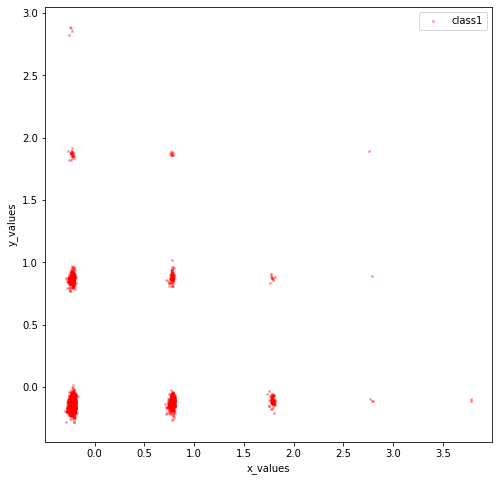

In [185]:

tocluster = pd.DataFrame(data_pca[[1,4]])
print (tocluster.shape)
print (tocluster.head())

fig = plt.figure(figsize=(8,8))
plt.plot(tocluster[1], tocluster[4], 'x', markersize=2, color='red', alpha=0.5, label='class1')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

In [200]:
silhouette_max = -50 # maximum 
min_clust = 2 # minimum number of clusters
max_clust = 6 # maximum number of clusters
random_state = 10 # random state usually 10
for n_cluster in range(min_clust,max_clust):    
    clusterer = KMeans(n_clusters=n_cluster, random_state=random_state)
    cluster_labels = clusterer.fit_predict(tocluster)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the clusters formed 
    silhouette_avg = silhouette_score(tocluster, cluster_labels)
    print("For n_clusters =", n_cluster,
          "The average silhouette_score is :", silhouette_avg)
    if(silhouette_avg>=silhouette_max):
        n_clusters=n_cluster
        silhouette_max=silhouette_avg
        
print("\nThe best number of clusters:", n_clusters)

For n_clusters = 2 The average silhouette_score is : 0.7805529158734239
For n_clusters = 3 The average silhouette_score is : 0.8981648414519442
For n_clusters = 4 The average silhouette_score is : 0.9166034381005195
For n_clusters = 5 The average silhouette_score is : 0.9442035649559779

The best number of clusters: 5


In [189]:
# cluster the users based on k-means clustering with best k
random_state = 42 # Can be 0
clusterer = KMeans(n_clusters=n_clusters,random_state=random_state).fit(tocluster)
centers = clusterer.cluster_centers_
c_preds = clusterer.predict(tocluster)


['blue', 'orange', 'orange', 'blue', 'orange', 'blue', 'blue', 'purple', 'orange', 'blue']


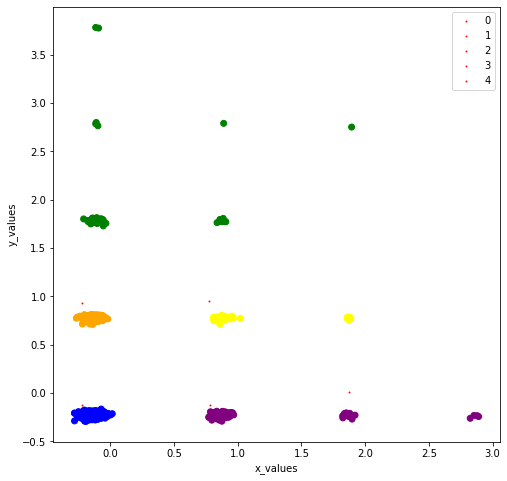

In [190]:
# plot the clustering

fig = plt.figure(figsize=(8,8))
colors = ['orange','blue','purple','green', 'yellow', 'brown', 'red', 'black', 'maroon']
colored = [colors[k] for k in c_preds]
print (colored[0:10])
plt.scatter(tocluster[4],tocluster[1],  color = colored)
for ci,c in enumerate(centers):
    plt.plot(c[0], c[1], 'o', markersize=1, color='red', alpha=0.9, label=''+str(ci))

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

In [191]:
# make a data frame with the cluster number for each user

clust_cities = cust_cities.copy()
clust_cities['cluster'] = c_preds
clust_cities.head(10)

cities   Calgary AB  Calgary AB, Chicago IL  Calgary AB, Edmonton AB  Calgary AB, Edmonton AB, Portland OR  Calgary AB, Edmonton AB, Seattle WA  Calgary AB, Edmonton AB, Seattle WA, Victoria BC  Calgary AB, Edmonton AB, Vancouver BC  Calgary AB, Edmonton AB, Vancouver BC, Seattle WA, Victoria BC  Calgary AB, Edmonton AB, Vancouver BC, Victoria BC  Calgary AB, Edmonton AB, Vancouver BC, Victoria BC, Portland OR  Calgary AB, Edmonton AB, Victoria BC  Calgary AB, Edmonton AB, Victoria BC, Seattle WA  Calgary AB, Edmonton AB, Victoria BC, Seattle WA, Portland OR  Calgary AB, Houston TX  Calgary AB, Los Angeles CA  Calgary AB, Los Angeles CA, Toronto ON  Calgary AB, Montreal QC  Calgary AB, New York NY  Calgary AB, New York NY, Chicago IL  Calgary AB, Portland OR  Calgary AB, Portland OR, Seattle WA  Calgary AB, Portland OR, Seattle WA, Victoria BC  Calgary AB, Portland OR, Vancouver BC, Victoria BC  Calgary AB, Seattle WA  Calgary AB, Seattle WA, Edmonton AB  Calgary AB, Seattle WA, Portland OR  Calgary AB, Seattle WA, Portland OR, Vancouver BC, Victoria BC  Calgary AB, Seattle WA, Vancouver BC  Calgary AB, Seattle WA, Vancouver BC, Victoria BC  Calgary AB, Seattle WA, Victoria BC  Calgary AB, Seattle WA, Victoria BC, Portland OR  Calgary AB, Seattle WA, Victoria BC, Vancouver BC  Calgary AB, Seattle WA, Victoria BC, Vancouver BC, Portland OR, Sacramento CA  Calgary AB, Toronto ON  Calgary AB, Toronto ON, New York NY  Calgary AB, Vancouver BC  Calgary AB, Vancouver BC, New York NY  Calgary AB, Vancouver BC, Portland OR, Seattle WA  Calgary AB, Vancouver BC, Seattle WA  Calgary AB, Vancouver BC, Seattle WA, Victoria BC  Calgary AB, Vancouver BC, Victoria BC  Calgary AB, Vancouver BC, Victoria BC, Seattle WA  Calgary AB, Victoria BC  Calgary AB, Victoria BC, Seattle WA  Calgary AB, Victoria BC, Vancouver BC  Calgary AB, Victoria BC, Vancouver BC, Edmonton AB  Calgary AB, Victoria BC, Vancouver BC, Seattle WA  Calgary AB, Victoria BC, Vancouver BC, Seattle WA, Portland OR  Calgary AB, Victoria BC, Vancouver BC, Seattle WA, Portland OR, Sacramento CA  Chicago IL  Chicago IL, Fort Wayne IN  Chicago IL, Fort Wayne IN, Cincinnati OH, Lexington KY  Chicago IL, Fort Wayne IN, Cincinnati OH, Louisville KY  Chicago IL, Fort Wayne IN, Columbus OH  Chicago IL, Fort Wayne IN, Columbus OH, Cincinnati OH  Chicago IL, Fort Wayne IN, Columbus OH, Cleveland OH, Windsor ON, Detroit MI  Chicago IL, Fort Wayne IN, Columbus OH, Toledo OH  Chicago IL, Fort Wayne IN, Indianapolis IN  Chicago IL, Fort Wayne IN, Indianapolis IN, Cincinnati OH, Lexington KY  Chicago IL, Fort Wayne IN, Indianapolis IN, Cincinnati OH, Lexington KY, Louisville KY  Chicago IL, Fort Wayne IN, Indianapolis IN, Cincinnati OH, Louisville KY  Chicago IL, Fort Wayne IN, Toledo OH  Chicago IL, Fort Wayne IN, Toledo OH, Cleveland OH  Chicago IL, Fort Wayne IN, Toledo OH, Cleveland OH, Detroit MI  Chicago IL, Fort Wayne IN, Toledo OH, Detroit MI  Chicago IL, Fort Wayne IN, Toledo OH, Windsor ON  Chicago IL, Fort Wayne IN, Toledo OH, Windsor ON, Detroit MI  Chicago IL, Fort Wayne IN, Toledo OH, Windsor ON, Detroit MI, Cleveland OH  Chicago IL, Fort Wayne IN, Windsor ON  Chicago IL, Fort Wayne IN, Windsor ON, Cleveland OH  Chicago IL, Houston TX  Chicago IL, Houston TX, New York NY  Chicago IL, Houston TX, Vancouver BC  Chicago IL, Indianapolis IN  Chicago IL, Indianapolis IN, Cincinnati OH  Chicago IL, Indianapolis IN, Cincinnati OH, Columbus OH  Chicago IL, Indianapolis IN, Cincinnati OH, Louisville KY, Lexington KY  Chicago IL, Indianapolis IN, Cincinnati OH, Louisville KY, Lexington KY, Nashville TN  Chicago IL, Indianapolis IN, Fort Wayne IN  Chicago IL, Indianapolis IN, Fort Wayne IN, Columbus OH  Chicago IL, Indianapolis IN, Lexington KY, Columbus OH, Toledo OH  Chicago IL, Indianapolis IN, Lexington KY, Louisville KY  Chicago IL, Indianapolis IN, Louisville KY  Chicago IL, Indianapolis IN, Louisville KY, Lexington KY  Chicago IL, Los Angeles CA  Chicago IL, Los Angeles CA, Montreal

In [192]:

c0 = clust_cities[clust_cities['cluster']==0].drop('cluster',axis=1).sum()

c1 = clust_cities[clust_cities['cluster']==1].drop('cluster',axis=1).sum()

c2 = clust_cities[clust_cities['cluster']==2].drop('cluster',axis=1).sum()

c3 = clust_cities[clust_cities['cluster']==3].drop('cluster',axis=1).sum()

c4 = clust_cities[clust_cities['cluster']==4].drop('cluster',axis=1).sum()

c5 = clust_cities[clust_cities['cluster']==5].drop('cluster',axis=1).sum()

c6 = clust_cities[clust_cities['cluster']==6].drop('cluster',axis=1).sum()


In [204]:
# Analyse top 15 cities searched by ussers in cluster 0

c0.sort_values(ascending=False)[0:30]

cities
Toronto ON                     931
New York NY                    348
Los Angeles CA                 184
Montreal QC                    148
Houston TX                      88
Vancouver BC                    74
Philadelphia PA                 69
Phoenix AZ                      66
San Antonio TX                  50
San Diego CA                    48
Calgary AB                      43
San Jose CA                     40
Detroit MI                      39
Dallas TX                       39
OTTAWA ON                       39
Jacksonville FL                 32
Columbus OH                     31
New York NY, Jersey City NJ     31
Edmonton AB                     31
Indianapolis IN                 29
Toronto ON, New York NY         29
New York NY, Toronto ON         28
Los Angeles CA, New York NY     26
New York NY, Newark NJ          22
Montreal QC, OTTAWA ON          22
New York NY, Los Angeles CA     22
Montreal QC, New York NY        21
Montreal QC, Toronto ON         18
New York NY, 

In [194]:
# Analyse top 15 cities searched by ussers in cluster 1

c1.sort_values(ascending=False)[0:15]

cities
New York NY                    1642
Los Angeles CA                  748
Montreal QC                     650
Vancouver BC                    378
Houston TX                      357
Philadelphia PA                 265
Phoenix AZ                      259
San Diego CA                    242
San Antonio TX                  217
Dallas TX                       207
OTTAWA ON                       181
Calgary AB                      166
New York NY, Jersey City NJ     161
Edmonton AB                     157
San Jose CA                     146
dtype: int64

In [164]:
# Analyse top 15 cities searched by ussers in cluster 2

c2.sort_values(ascending=False)[0:15]

cities
Chicago IL                     585
New York NY                    189
Los Angeles CA                 107
Montreal QC                     83
Vancouver BC                    44
Houston TX                      40
San Antonio TX                  38
Dallas TX                       34
OTTAWA ON                       34
San Diego CA                    30
Phoenix AZ                      29
Calgary AB                      28
Philadelphia PA                 26
New York NY, Jersey City NJ     25
Indianapolis IN                 24
dtype: int64

In [195]:
# Analyse top 15 cities searched by ussers in cluster 3

c3.sort_values(ascending=False)[0:15]

cities
Toronto ON                 219
New York NY                 51
San Diego CA                17
Montreal QC                 17
Los Angeles CA              15
San Antonio TX              14
Chicago IL                  13
Phoenix AZ                   8
Houston TX                   8
Dallas TX                    6
New York NY, Toronto ON      6
Columbus OH                  5
Indianapolis IN              5
Philadelphia PA              5
Vancouver BC                 3
dtype: int64

In [196]:
# Analyse top 15 cities searched by ussers in cluster 4

c4.sort_values(ascending=False)[0:15]

cities
Chicago IL                    127
Toronto ON                    118
New York NY                    48
Montreal QC                    19
Los Angeles CA                 18
Phoenix AZ                      9
Dallas TX                       8
Vancouver BC                    8
San Antonio TX                  8
Indianapolis IN                 7
Houston TX                      7
Chicago IL, New York NY         7
San Jose CA                     6
New York NY, Newark NJ          6
Los Angeles CA, Toronto ON      6
dtype: int64

In [197]:
# Analyse top 15 cities searched by ussers in cluster 5
# c5.sort_values(ascending=False)[0:15]

In [203]:
#The following table depicts the copunts of top 8 cities with respect to the other top 8 cities in each cluster. 
#It is easy some interesting differences among the clusters.

cluster_sum = [[c0['New York NY'],c0['Toronto ON'],c0['Los Angeles CA'], c0['Montreal QC'], c0['Chicago IL'],c0['Vancouver BC'],c0['Houston TX']],
                 [c1['New York NY'],c1['Toronto ON'],c1['Los Angeles CA'], c1['Montreal QC'], c1['Chicago IL'],c1['Vancouver BC'],c1['Houston TX']],
                 [c2['New York NY'],c2['Toronto ON'],c2['Los Angeles CA'], c2['Montreal QC'], c2['Chicago IL'],c2['Vancouver BC'],c2['Houston TX']],
                 [c3['New York NY'],c3['Toronto ON'],c3['Los Angeles CA'], c3['Montreal QC'], c3['Chicago IL'],c3['Vancouver BC'],c3['Houston TX']],
                 [c4['New York NY'],c4['Toronto ON'],c4['Los Angeles CA'], c4['Montreal QC'], c4['Chicago IL'],c4['Vancouver BC'],c4['Houston TX']],
                 
                ]
                 
cluster_sum = pd.DataFrame(cluster_sum, columns = ['New York NY','Toronto ON','Los Angeles CA','Montreal QC','Chicago IL','Vancouver BC','Houston TX'])
HTML(cluster_means.to_html())

#  The users in cluster 0 searched Toronto more compared to other clusters, they never searched for Chicago
#  The users in cluster 1 searched New York, Los Angeles, Montreal, and Vancouver more compared to other clusters, do not search for Toronto and Chicago
#  The users in cluster 2 search a lot for Chicago compared to other clusters, they also never search for Toronto
#  The users in cluster 3 and 4 search a lot for Toronto and in depth analysis is required to study their search pattern

,New York NY,Toronto ON,Los Angeles CA,Montreal QC,Chicago IL,Vancouver BC,Houston TX
0,348,931,184,148,0,74,88
1,1642,0,748,650,0,378,357
2,189,0,107,83,585,44,40
3,51,219,15,17,13,3,8
4,48,118,18,19,127,8,7
